# This program is used to achieve fast condensed nearest neighbors¶

Ball Tree + FCNN + Teacher student

Jul. 15, 2021

In [1]:
# import necessary package
import matplotlib.pyplot as plt
import numpy as np

import time

from PIL import Image

from scipy.spatial import distance
from scipy.stats import entropy

from sklearn.decomposition import PCA

from sklearn.neighbors import NearestCentroid

from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier

from tqdm import tqdm

from scipy import ndimage

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

128
128
the training image is: 


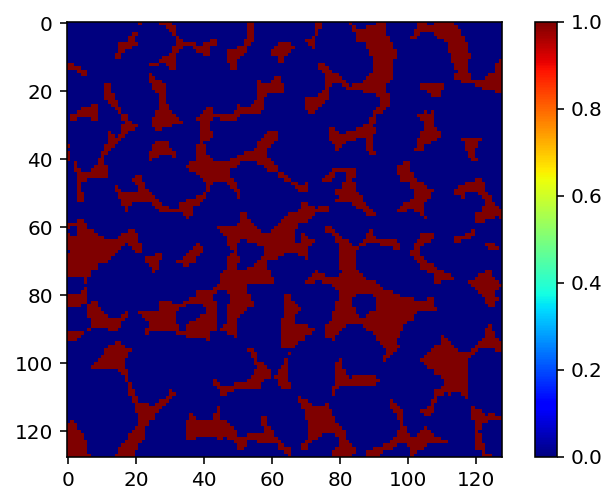

The porosity of TI is 0.248779296875


In [2]:
# read the training image
TIBMP = Image.open("Sandstone1.jpg",'r')
TIInt = TIBMP.load()
TI_Width = TIBMP.size[0]
TI_Height = TIBMP.size[1]

TI = np.array(TIBMP)/255
TI = TI[:,:,0]

TI[ TI > 0.5 ] = 1.0
TI[ TI <= 0.5 ] = 0.0

# TI.astype(int)
TI_list = TI.tolist()

print(TI_Width)
print(TI_Height)
print("the training image is: ")
plt.imshow(TI,vmin=0, vmax=1,cmap='jet')
plt.colorbar()
plt.show()

print(f'The porosity of TI is {np.argwhere(TI==1.0).shape[0] / (TI_Height * TI_Width)}')

In [3]:
def TemplatePointSequence(template_radius_y,
                          template_radius_x,
                          grid_factor):
    '''determine the sequence about how to create a pattern'''
    
    sequence_y = []
    sequence_x = []
    sequence_distance = []
    
    for point_y in range(-template_radius_y,template_radius_y+1):
        for point_x in range(-template_radius_x,template_radius_x+1):
            sequence_y.append(point_y*grid_factor)
            sequence_x.append(point_x*grid_factor)
            sequence_distance.append(np.sqrt(point_y*point_y+point_x*point_x))
    
    sequence_y = np.array(sequence_y).astype(int)
    sequence_x = np.array(sequence_x).astype(int)
    sequence_distance = np.array(sequence_distance)
            
    rank = np.argsort(sequence_distance)
    
    sequence_y = sequence_y[rank]
    sequence_x = sequence_x[rank]
    
    sequence_y = np.delete(arr=sequence_y,obj=0)
    sequence_x = np.delete(arr=sequence_x,obj=0)
    
    return sequence_y.tolist(), sequence_x.tolist()

In [4]:
def ExtractPattern_Training(domain2D_list,
                            center_y,center_x,
                            sequence_y,sequence_x):
    
    '''extract a pattern from training image based on a given location'''
    
    pattern = []
    for relative_y, relative_x in zip(sequence_y,sequence_x):
        pattern.append(domain2D_list[center_y+relative_y][center_x+relative_x])
    return np.array(pattern)

In [5]:
def ExtractPattern_Simulation(domain2D_list,
                              domain_height,domain_width,
                              center_y,center_x,
                              sequence_y,sequence_x,
                              unknownSymbol=-1):
    
    '''extract a pattern from simulation grid based on a given location'''
    
    
    pattern = []
    for relative_y, relative_x in zip(sequence_y,sequence_x):
        point_y = center_y + relative_y
        point_x = center_x + relative_x
        if(point_y>=0 and point_y<domain_height and point_x>=0 and point_x<domain_width):
            pattern.append(domain2D_list[point_y][point_x])
        else:
            pattern.append(unknownSymbol)
    pattern = np.array(pattern)
    knownAmount = np.argwhere(pattern != unknownSymbol).shape[0]
    return pattern, knownAmount

In [6]:
def EncodePattern_OneHotEncoding(pattern_input,patternSize,faciesAmount):
    
    '''convert pattern using one-hot encoding'''
    '''Important warning pattern: original pattern  vector: pattern after one-hot encoding'''
    
    pattern_output = np.zeros((patternSize,faciesAmount))
    
    for index, element in enumerate(pattern_input):
        if(element >= 0):
            pattern_output[index,int(element)] = 1.0
        
    pattern_output = pattern_output.reshape(-1)
    
    return pattern_output

In [7]:
def ConstructPatternBase_Multigrid(TI_list,
                                  TI_Height,TI_Width,
                                  sequence_y, sequence_x,
                                  template_radius_y,template_radius_x, 
                                  grid_factor, 
                                  faciesAmount = 2,unknownSymbol=-1):
    
    '''construct pattern database within the multi-grid framework'''
     
    patternSize = len(sequence_y)   # the dimension of pattern
    
    PatternBase = []
    Pattern_label = []
    
    for center_y in range(grid_factor*template_radius_y,TI_Height-grid_factor*template_radius_y): 
        for center_x in range(grid_factor*template_radius_x,TI_Width-grid_factor*template_radius_x): 
            # extract a pattern
            pattern = ExtractPattern_Training(domain2D_list=TI_list,
                                              center_y=center_y,center_x=center_x,
                                              sequence_y=sequence_y,sequence_x=sequence_x)
            
            # store pattern in database
            PatternBase.extend(pattern.tolist())
            Pattern_label.append(TI_list[center_y][center_x])
            
    PatternBase = np.array(PatternBase).astype(int)
    PatternBase = PatternBase.reshape((-1,patternSize))
            
    return PatternBase, np.array(Pattern_label)

In [8]:
def ConstructPatternBase_Multigrid_OneHotEncoding(TI_list,
                                                  TI_Height,TI_Width,
                                                  sequence_y, sequence_x,
                                                  template_radius_y,template_radius_x, 
                                                  grid_factor, 
                                                  faciesAmount = 2,unknownSymbol=-1):
    
    '''construct pattern database within the multi-grid framework'''
     
    patternSize = len(sequence_y)   # the dimension of pattern
    vectorSize = faciesAmount*patternSize
    
    VectorBase = []
    VectorBase_label = []
    
    for center_y in range(grid_factor*template_radius_y,TI_Height-grid_factor*template_radius_y): 
        for center_x in range(grid_factor*template_radius_x,TI_Width-grid_factor*template_radius_x): 
            # extract a pattern
            pattern = ExtractPattern_Training(domain2D_list=TI_list,
                                              center_y=center_y,center_x=center_x,
                                              sequence_y=sequence_y,sequence_x=sequence_x)
            # convert pattern using one hot encoding
            vector = EncodePattern_OneHotEncoding(pattern_input=pattern,
                                                  patternSize=patternSize,
                                                  faciesAmount=faciesAmount)
            
            # store pattern in database
            VectorBase.extend(vector.tolist())
            VectorBase_label.append(TI_list[center_y][center_x])
            
    VectorBase = np.array(VectorBase).astype(int)
    VectorBase = VectorBase.reshape((-1,vectorSize))
            
    return VectorBase, np.array(VectorBase_label)

In [9]:
def Principal_Component_Analysis(VectorBase):
    
#     print('running PCA')
    EnergyThreshold = 0.9
    
    vectorSize = VectorBase.shape[1]
    
    pca = PCA(n_components=vectorSize)
    pca.fit(VectorBase)
    
    varianceVector = pca.explained_variance_ratio_
    cumulativeVarianceVector = np.cumsum(varianceVector)
    SelectDimension = np.searchsorted(cumulativeVarianceVector, EnergyThreshold)+1
#     print("The reduced dimension is "+str(SelectDimension))
    
    VectorBase_Decompose = pca.transform(VectorBase)[:,0:SelectDimension]
    
#     fig, ax = plt.subplots()
#     ax.plot(np.linspace(1,vectorSize,vectorSize),cumulativeVarianceVector,color='r',linewidth=2,label='cumulative Variance')
#     ax.legend(loc='upper right')
#     ax.set_yticks(np.linspace(0,1.1,12))
#     ax.set_ylabel('cumulative variance')
#     ax.set_xlabel('dimension')
#     plt.show()
    
    return VectorBase_Decompose

In [10]:
def Fast_condensed_nearest_neighbor(Dataset, Dataset_labels):
    
    '''carry out fast condensed nearest neighbor (FCNN) to remove noisy patterns'''
    
    Num_neighbors = 5
    FCNN_Iteration_Max = 100
    
    
    # find the centroids
    nearest_centroid_instance = NearestCentroid().fit(Dataset, Dataset_labels)
    centroids =  nearest_centroid_instance.centroids_  # centroid is the mean value
    
    knn_instance = NearestNeighbors(n_neighbors = 1,
                                        algorithm = 'ball_tree',
                                        metric = 'euclidean')

    knn_instance.fit(X=Dataset)
    
    neighbors_distance, neighbors_index = knn_instance.kneighbors(X=centroids)
    
    S_indices = np.copy(neighbors_index).reshape(-1)
    S = np.copy(Dataset[S_indices])
    
    iteration_index = 0
    
    Dataset_element_num = Dataset.shape[0]
    
    knn_classifier_instance = KNeighborsClassifier(n_neighbors = 1,
                                                      algorithm = 'auto',
                                                      metric = 'euclidean')
    
    for iteration_index in tqdm(range(FCNN_Iteration_Max)):
        
        if(S_indices.shape[0] < Num_neighbors):
            knn_classifier_instance = KNeighborsClassifier(n_neighbors = 1,
                                                      algorithm = 'auto',
                                                      metric = 'euclidean')
        else:
            knn_classifier_instance = KNeighborsClassifier(n_neighbors = Num_neighbors,
                                                      algorithm = 'auto',
                                                      metric = 'euclidean')
        
        T_indices = np.setdiff1d(np.arange(0,Dataset_element_num,1), S_indices)
        T = np.copy(Dataset[T_indices])
        
        knn_classifier_instance.fit(X = S, y=Dataset_labels[S_indices])
        
        labels_predict = knn_classifier_instance.predict(X = T)
        
        difference = Dataset_labels[T_indices] - labels_predict
        
        misclassified_indices = np.argwhere( difference != 0.0  ).reshape(-1)
        
        if(misclassified_indices.shape[0] == 0):
            break
        
        neighbor_distance, misclassified_medoid_indices = knn_classifier_instance.kneighbors(X = T[misclassified_indices])
        misclassified_medoid_indices = np.unique(misclassified_medoid_indices)
        
        knn_instance.fit(X = T[misclassified_indices])
        
        neighbors_distance, representative_indices = knn_instance.kneighbors(X = S[misclassified_medoid_indices])
        
        alpha_S_indices = T_indices[misclassified_indices[representative_indices]].reshape(-1)
        
        S_indices = np.concatenate((S_indices, alpha_S_indices))
        S_indices = np.unique(S_indices)
        S = np.copy(Dataset[S_indices])

#         plt.scatter(Dataset[:,0], Dataset[:,1],
#                     c=Dataset_labels, cmap='Greens',
#                     s=20, lw=0,
#                     vmin=-1, vmax=2)
#         plt.scatter(Dataset[S_indices,0], Dataset[S_indices,1],
#                     c='r',
#                     s=60, lw=0)
#         plt.scatter(Dataset[alpha_S_indices,0], Dataset[alpha_S_indices,1],
#                     c='b',
#                     s=60, lw=0)
#         plt.xlabel(str('PC1'),fontsize='large')
#         plt.ylabel(str('PC2'),fontsize='large')
#         plt.tick_params(direction='in',labelsize='large')
#         plt.title(f'Iteration {iteration_index} with {S.shape[0]} patterns')
#         plt.show()
        
#         print(f'S indices: {S_indices}')
#         print(f'S labels: {Dataset_labels[S_indices]}')
    
    return np.copy(S_indices)

In [11]:
def ConstructPatternBase_Multigrid_FCNN(TI_list,
                                          TI_Height,TI_Width,
                                          sequence_y, sequence_x,
                                          template_radius_y,template_radius_x, 
                                          grid_factor, 
                                          faciesAmount = 2,unknownSymbol=-1):
    
    print(f'Carrying out fast condensed nearest neighbor')
    
    Dataset, Labels = ConstructPatternBase_Multigrid_OneHotEncoding(TI_list = TI_list,
                                                                TI_Height = TI_Height,
                                                                TI_Width = TI_Width,
                                                                sequence_y = sequence_y,
                                                                sequence_x = sequence_x,
                                                                template_radius_y = template_radius_y,
                                                                template_radius_x = template_radius_x, 
                                                                grid_factor = grid_factor, 
                                                                faciesAmount = Facies_Amount,
                                                                unknownSymbol = UnknownSymbol)


    Dataset_decomposed = Principal_Component_Analysis(VectorBase = Dataset)

    Dataset_resampled_indices = Fast_condensed_nearest_neighbor(Dataset = Dataset_decomposed,
                                                                            Dataset_labels = Labels)
    
#     plt.scatter(Dataset_decomposed[:,0], Dataset_decomposed[:,1], c = Labels, cmap='jet', s=7)
#     plt.title(f'{Dataset_decomposed.shape[0]} Patterns before ENN')
#     plt.show()

#     plt.scatter(Dataset_decomposed[Dataset_resampled_indices,0], Dataset_decomposed[Dataset_resampled_indices,1],
#                 c = Labels[Dataset_resampled_indices], cmap='jet', s=7)
#     plt.title(f'{Dataset_resampled_indices.shape[0]} Patterns after ENN')
#     plt.show()

    print(f'The number of patterns before FCNN {Dataset_decomposed.shape[0]}')
    print(f'The number of patterns after  FCNN {Dataset_resampled_indices.shape}')
    
    return Dataset_resampled_indices

In [12]:
def RandomSimulationPath(domain_layer, domain_height, domain_width, grid_factor):
    '''define the simulation path within the multi-grid framework'''
    
    layer = domain_layer // grid_factor
    height = domain_height // grid_factor
    width = domain_width // grid_factor
    
    simulationPath = np.arange(layer*height*width)
    np.random.shuffle(simulationPath)
    
    simulationPath_z = simulationPath // (height * width)
    simulationPath_y = (simulationPath % (height * width)) // width
    simulationPath_x = (simulationPath % (height * width)) % width
    simulationPath_z = simulationPath_z * grid_factor
    simulationPath_y = simulationPath_y * grid_factor
    simulationPath_x = simulationPath_x * grid_factor
    
    return simulationPath_z.astype(int).tolist(), simulationPath_y.astype(int).tolist(), simulationPath_x.astype(int).tolist()

In [13]:
def InitializeRealization3D_unconditional(domain_layer,domain_height,domain_width,
                                          sampleRate,
                                          probability,
                                          faciesAmount=2, unknownSymbol=-1):
    
    '''initialize a realization'''
    
    sampleAmount = int(domain_layer*domain_height*domain_width*sampleRate)
    
    hardDataPath = np.arange(domain_layer*domain_height*domain_width)
    np.random.shuffle(hardDataPath)
    hardDataPath = hardDataPath[:sampleAmount]
    hardDataPath_z = hardDataPath // (domain_height * domain_width)
    hardDataPath_y = (hardDataPath % (domain_height*domain_width)) // domain_width
    hardDataPath_x = (hardDataPath % (domain_height*domain_width)) % domain_width
    
#     hardDataValue = np.random.randint(low=0,high=faciesAmount,size=sampleAmount)
    
    hardDataValue = np.random.choice(a = np.arange(start=0,stop=faciesAmount,step=1),
                                     p = probability,
                                     size = sampleAmount)
    
    Realization3D = np.full(shape=(domain_layer, domain_height, domain_width), fill_value=unknownSymbol)
    
    for center_z, center_y, center_x, value in zip(hardDataPath_z, hardDataPath_y, hardDataPath_x, hardDataValue):
        Realization3D[center_z, center_y, center_x] = value
    
    return Realization3D

In [14]:
def Migrate_HardData_to_Coarse_Grid(Realization3D,
                                    SG_Layer, SG_Height, SG_Width,
                                    MaxGrid,
                                    UnknownSymbol):
    
    grid_factor = 2**MaxGrid
    
    Distance_to_HardData = np.full((SG_Layer, SG_Height, SG_Width), fill_value=10000)
    
    for z in range(0, SG_Layer):
        for y in range(0, SG_Height):
            for x in range(0, SG_Width):

                if(Realization3D[z, y, x] != UnknownSymbol):

                    value = Realization3D[z, y, x]
                    
                    z_migrated = int((z // grid_factor) * grid_factor)
                    y_migrated = int((y // grid_factor) * grid_factor)
                    x_migrated = int((x // grid_factor) * grid_factor)

                    distance = (z-z_migrated)**2 + (y-y_migrated)**2 + (x-x_migrated)**2

                    if( distance < Distance_to_HardData[z_migrated, y_migrated, x_migrated]):
                        Realization3D[z_migrated, y_migrated, x_migrated] = value

                        Distance_to_HardData[z_migrated, y_migrated, x_migrated] = distance
                    
    return Realization3D

In [15]:
def ProbabilityAggregation_LinearCombination(p1,p2,p3):
    
    Probabilities = np.add(p1,p2)
    Probabilities = np.add(Probabilities, p3)
    Probabilities = Probabilities / np.sum(Probabilities)     
    
#     print(f'p1: {p1}')
#     print(f'p2: {p2}')
#     print(f'p3: {p3}')
#     print(f'Global: {Probabilities}')
    
    return Probabilities

In [16]:
def ProbabilityAggregation_WeightedCombination(p1,p2,p3,w1,w2,w3):
    
    if((w1+w2+w3)!=0):
    
        weight1 = w1/(w1+w2+w3)
        weight2 = w2/(w1+w2+w3)
        weight3 = w3/(w1+w2+w3)

        Probabilities = np.add(weight1*p1,weight2*p2)
        Probabilities = np.add(Probabilities, weight3*p3)
        Probabilities = Probabilities / np.sum(Probabilities)
        
    else:
        Probabilities = ProbabilityAggregation_LinearCombination(p1 = p1,
                                                                 p2 = p2,
                                                                 p3 = p3)
    
#     print(f'p1: {p1}')
#     print(f'p2: {p2}')
#     print(f'p3: {p3}')
#     print(f'Global: {Probabilities}')
    
    return Probabilities

In [17]:
def ProbabilityAggregation_Bordley_twoFacies(p1,p2,p3,weight):
    
    probability_target = np.array([0.752, 0.248])
    odd_0 = np.divide(probability_target, (1-probability_target) )
    
    alpha = 0.00001
    p1 = (p1 + alpha)/ (1+2*alpha)
    p2 = (p2 + alpha)/ (1+2*alpha)
    p3 = (p3 + alpha)/ (1+2*alpha)
    
    odd_1 = np.divide(p1, (1-p1))
    odd_2 = np.divide(p2, (1-p2))
    odd_3 = np.divide(p3, (1-p3))
    
    w1 = weight
    w2 = w1
    w3 = w1
    w0 = 1 - (w1 + w2 + w3)
    
    odd_0 = np.power(odd_0, w0)
    odd_1 = np.power(odd_1, w1)
    odd_2 = np.power(odd_2, w2)
    odd_3 = np.power(odd_3, w3)
    
    odd_global = np.multiply(odd_0, odd_1)
    odd_global = np.multiply(odd_global, odd_2)
    odd_global = np.multiply(odd_global, odd_3)
    
    probability_global = np.divide(odd_global, 1+odd_global)
    
    return probability_global

In [18]:
def Simulate_Realizations_TeacherStudent(TrainingImage,
                                     TrainingImage_list,
                                     TI_Height,
                                     TI_Width,
                                     SG_Amount,
                                     SG_Layer,
                                     SG_Height,
                                     SG_Width,
                                     MultiGrid,
                                     Template_radius_y,
                                     Template_radius_x,
                                     Num_neighbors,
                                     PA_weight_teacher,
                                     PA_weight_student,
                                     Teacher_realization,
                                     Student_Update_Fraction,
                                     Divergence_Threshold,
                                     FaciesAmount,
                                     SampleRate,
                                     InitialProbability,
                                     UnknownSymbol):
    
    '''simulate one realization with KD tree'''
    
    print('Student subset and Ball tree searching')
    
    # unconditional simulation
    RealizationSet = []
    for index_realization in range(SG_Amount):    

        SimulationGrid = InitializeRealization3D_unconditional(domain_layer = SG_Layer,
                                                              domain_height = SG_Height,
                                                              domain_width = SG_Width,
                                                              sampleRate = SampleRate,
                                                              probability = InitialProbability,
                                                              faciesAmount = FaciesAmount,
                                                              unknownSymbol = UnknownSymbol)
        RealizationSet.extend(SimulationGrid.tolist())
        
    RealizationSet = np.array(RealizationSet)
    RealizationSet = RealizationSet.reshape((SG_Amount, SG_Layer, SG_Height, SG_Width))
    
    # migrate hard data to coarsest grid
    for index_realization in range(SG_Amount):
        Realization3D = Migrate_HardData_to_Coarse_Grid(Realization3D = RealizationSet[index_realization],
                                    SG_Layer = SG_Layer, SG_Height = SG_Height, SG_Width=SG_Width,
                                    MaxGrid = MultiGrid,
                                    UnknownSymbol = UnknownSymbol)
        RealizationSet[index_realization] = np.copy(Realization3D)
    
    # multigrid strategy
    for grid in np.arange(start=MultiGrid, stop=-1, step=-1):
        
        print(f'\n\n\n Grid {grid}:')
        
        grid_factor = 2**grid
        
        # define the sequence to collect hard data
        sequence_y, sequence_x = TemplatePointSequence(template_radius_y=Template_radius_y,
                                                  template_radius_x=Template_radius_x,
                                                  grid_factor=grid_factor)
        
        # construct a pattern dataset
        Dataset, Labels = ConstructPatternBase_Multigrid(TI_list = TrainingImage_list,
                                                                TI_Height = TI_Height,
                                                                TI_Width = TI_Width,
                                                                sequence_y = sequence_y,
                                                                sequence_x = sequence_x,
                                                                template_radius_y = Template_radius_y,
                                                                template_radius_x = Template_radius_x, 
                                                                grid_factor = grid_factor, 
                                                                faciesAmount = Facies_Amount,
                                                                unknownSymbol = UnknownSymbol)
        
        Labels = Labels.astype(int)
        
        teacher_instance = NearestNeighbors(n_neighbors = Num_neighbors,
                                            algorithm = 'ball_tree',
                                            metric='hamming')
        teacher_instance.fit(Dataset)
        
        if(grid <= 2):
            FCNN_resample_indices = ConstructPatternBase_Multigrid_FCNN(TI_list = TrainingImage_list,
                                                                    TI_Height = TI_Height,
                                                                    TI_Width = TI_Width,
                                                                    sequence_y = sequence_y,
                                                                    sequence_x = sequence_x,
                                                                    template_radius_y = Template_radius_y,
                                                                    template_radius_x = Template_radius_x, 
                                                                    grid_factor = grid_factor, 
                                                                    faciesAmount = Facies_Amount,
                                                                    unknownSymbol = UnknownSymbol)

            Dataset_FCNN = np.copy(Dataset[FCNN_resample_indices])
            Labels_FCNN = np.copy(Labels[FCNN_resample_indices])
        else:
            FCNN_resample_indices = np.arange(0,Dataset.shape[0],1,dtype=int)
            Dataset_FCNN = np.copy(Dataset)
            Labels_FCNN = np.copy(Labels)
        
        
        student_instance = NearestNeighbors(n_neighbors = Num_neighbors,
                                            algorithm = 'ball_tree',
                                            metric='hamming')
        student_instance.fit(Dataset_FCNN)
        
        Student_resample_indices = np.copy(FCNN_resample_indices).tolist()
        Dataset_student = np.copy(Dataset[Student_resample_indices])
        Labels_student = np.copy(Labels[Student_resample_indices])
        
        for index_realization in range(SG_Amount):
            
            print(f'Realization {index_realization}:')
            
            Realization3D = np.copy(RealizationSet[index_realization])
            Realization3D_list_z = Realization3D.tolist()
            Realization3D_list_y = np.moveaxis(a=Realization3D,source=1,destination=0).tolist()
            Realization3D_list_x = np.moveaxis(a=Realization3D,source=2,destination=0).tolist()
            
            # define a random simulation path
            simulationPath_z, simulationPath_y, simulationPath_x = RandomSimulationPath(domain_layer = SG_Layer,
                                                                                        domain_height = SG_Height,
                                                                                        domain_width = SG_Width,
                                                                                        grid_factor = grid_factor)
            
            simulationPath_length = len(simulationPath_z)
            Student_Update_Interval = int(simulationPath_length * Student_Update_Fraction)
                                          
            if(index_realization < Teacher_realization):
                # teacher simulation
                
                for simulationPath_index in tqdm(range(simulationPath_length)):

                    unknown_z = simulationPath_z[simulationPath_index]
                    unknown_y = simulationPath_y[simulationPath_index]
                    unknown_x = simulationPath_x[simulationPath_index]
                
                    if(Realization3D_list_z[unknown_z][unknown_y][unknown_x]!=UnknownSymbol):
                        continue
                        
                    # the xy plane
                    conditioningPattern_xy, knownAmount_xy = ExtractPattern_Simulation(domain2D_list = Realization3D_list_z[unknown_z],
                                                                              domain_height = SG_Height,
                                                                              domain_width = SG_Width,
                                                                              center_y = unknown_y,
                                                                              center_x = unknown_x,
                                                                              sequence_y = sequence_y,
                                                                              sequence_x = sequence_x,
                                                                              unknownSymbol = UnknownSymbol)

                    if(knownAmount_xy == 0):
                        conditionalProbability_xy = np.full((FaciesAmount,), fill_value=1/FaciesAmount)
                    else:
                        # perform a ball tree search to find comparable pattern
                        conditioningPattern = np.array(conditioningPattern_xy).reshape((1,-1))

                        # teacher
                        patternDistance, similarityIndex = teacher_instance.kneighbors(conditioningPattern)
                        similarityIndex_teacher = similarityIndex.reshape(-1)
                        occurrence_xy_teacher = np.bincount(Labels[similarityIndex_teacher], minlength=FaciesAmount)
                        conditionalProbability_xy = occurrence_xy_teacher / Num_neighbors

                        # student
                        patternDistance, similarityIndex = student_instance.kneighbors(conditioningPattern)
                        similarityIndex_student = similarityIndex.reshape(-1)
                        occurrence_xy_student = np.bincount(Labels_student[similarityIndex_student], minlength=FaciesAmount)

                        # cosine distance
                        divergence = distance.cosine(occurrence_xy_teacher, occurrence_xy_student)
                        if(divergence > Divergence_Threshold):
                            # student cannot address this conditioning pattern
                            Student_resample_indices.extend(similarityIndex_teacher.tolist())

                        

                    # the xz plane
                    conditioningPattern_xz, knownAmount_xz = ExtractPattern_Simulation(domain2D_list = Realization3D_list_y[unknown_y],
                                                                                  domain_height = SG_Layer,
                                                                                  domain_width = SG_Width,
                                                                                  center_y = unknown_z,
                                                                                  center_x = unknown_x,
                                                                                  sequence_y = sequence_y,
                                                                                  sequence_x = sequence_x,
                                                                                  unknownSymbol = UnknownSymbol)

                    if(knownAmount_xz == 0):
                        conditionalProbability_xz = np.full((FaciesAmount,), fill_value=1/FaciesAmount)
                    else:
                        conditioningPattern = np.array(conditioningPattern_xz).reshape((1,-1))
                        patternDistance, similarityIndex = teacher_instance.kneighbors(conditioningPattern)
                        similarityIndex_teacher = similarityIndex.reshape(-1)
                        occurrence_xz_teacher = np.bincount(Labels[similarityIndex_teacher], minlength=FaciesAmount)
                        conditionalProbability_xz = occurrence_xz_teacher / Num_neighbors

                    # the yz plane
                    conditioningPattern_yz, knownAmount_yz = ExtractPattern_Simulation(domain2D_list = Realization3D_list_x[unknown_x],
                                                                                  domain_height = SG_Layer,
                                                                                  domain_width = SG_Height,
                                                                                  center_y = unknown_z,
                                                                                  center_x = unknown_y,
                                                                                  sequence_y = sequence_y,
                                                                                  sequence_x = sequence_x,
                                                                                  unknownSymbol = UnknownSymbol)

                    if(knownAmount_yz == 0):
                        conditionalProbability_yz = np.full((FaciesAmount,), fill_value=1/FaciesAmount)
                    else:
                        # perform a ball tree search to find comparable pattern
                        conditioningPattern = np.array(conditioningPattern_yz).reshape((1,-1))
                        patternDistance, similarityIndex = teacher_instance.kneighbors(conditioningPattern)
                        similarityIndex_teacher = similarityIndex.reshape(-1)
                        occurrence_yz_teacher = np.bincount(Labels[similarityIndex_teacher], minlength=FaciesAmount)
                        conditionalProbability_yz = occurrence_yz_teacher / Num_neighbors

                    conditionalProbability = ProbabilityAggregation_Bordley_twoFacies(p1 = conditionalProbability_xy,
                                                                      p2 = conditionalProbability_xz,
                                                                      p3 = conditionalProbability_yz,
                                                                      weight = PA_weight_teacher)
                    
                    unknown_value = int(np.random.choice(a = np.arange(start=0,stop=FaciesAmount,step=1),
                                                     p = conditionalProbability,size=1)[0])
                    Realization3D_list_z[unknown_z][unknown_y][unknown_x] = unknown_value
                    Realization3D_list_y[unknown_y][unknown_z][unknown_x] = unknown_value
                    Realization3D_list_x[unknown_x][unknown_z][unknown_y] = unknown_value
                    

                    # update student subset
                    if(simulationPath_index % Student_Update_Interval == 0):
                        Student_resample_indices = np.unique(Student_resample_indices).tolist()
                        Dataset_student = np.copy(Dataset[Student_resample_indices])
                        Labels_student = np.copy(Labels[Student_resample_indices])
                        
                        student_instance = NearestNeighbors(n_neighbors = Num_neighbors,
                                            algorithm = 'ball_tree',
                                            metric='hamming')
                        student_instance.fit(Dataset_student)
#                         print(f'The size of student subset is {Dataset_student.shape}')
            else:
            # student simulation
                if(index_realization == Teacher_realization):
                    Student_resample_indices = np.unique(Student_resample_indices).tolist()
                    Dataset_student = np.copy(Dataset[Student_resample_indices])
                    Labels_student = np.copy(Labels[Student_resample_indices])

                    student_instance = NearestNeighbors(n_neighbors = Num_neighbors,
                                        algorithm = 'ball_tree',
                                        metric='hamming')
                    student_instance.fit(Dataset_student)
                
                for simulationPath_index in tqdm(range(simulationPath_length)):
                    
                    
                    unknown_z = simulationPath_z[simulationPath_index]
                    unknown_y = simulationPath_y[simulationPath_index]
                    unknown_x = simulationPath_x[simulationPath_index]
                
                    if(Realization3D_list_z[unknown_z][unknown_y][unknown_x]!=UnknownSymbol):
                        continue
                        
                    # the xy plane
                    conditioningPattern_xy, knownAmount_xy = ExtractPattern_Simulation(domain2D_list = Realization3D_list_z[unknown_z],
                                                                              domain_height = SG_Height,
                                                                              domain_width = SG_Width,
                                                                              center_y = unknown_y,
                                                                              center_x = unknown_x,
                                                                              sequence_y = sequence_y,
                                                                              sequence_x = sequence_x,
                                                                              unknownSymbol = UnknownSymbol)

                    if(knownAmount_xy == 0):
                        conditionalProbability_xy = np.full((FaciesAmount,), fill_value=1/FaciesAmount)
                    else:
                        # perform a ball tree search to find comparable pattern
                        conditioningPattern = np.array(conditioningPattern_xy).reshape((1,-1))
                        patternDistance, similarityIndex = student_instance.kneighbors(conditioningPattern)
                        similarityIndex_student = similarityIndex.reshape(-1)
                        occurrence_xy_student = np.bincount(Labels_student[similarityIndex_student], minlength=FaciesAmount)
                        conditionalProbability_xy = occurrence_xy_student / Num_neighbors

                        

                    # the xz plane
                    conditioningPattern_xz, knownAmount_xz = ExtractPattern_Simulation(domain2D_list = Realization3D_list_y[unknown_y],
                                                                                  domain_height = SG_Layer,
                                                                                  domain_width = SG_Width,
                                                                                  center_y = unknown_z,
                                                                                  center_x = unknown_x,
                                                                                  sequence_y = sequence_y,
                                                                                  sequence_x = sequence_x,
                                                                                  unknownSymbol = UnknownSymbol)

                    if(knownAmount_xz == 0):
                        conditionalProbability_xz = np.full((FaciesAmount,), fill_value=1/FaciesAmount)
                    else:
                        conditioningPattern = np.array(conditioningPattern_xz).reshape((1,-1))
                        patternDistance, similarityIndex = student_instance.kneighbors(conditioningPattern)
                        similarityIndex_student = similarityIndex.reshape(-1)
                        occurrence_xz_student = np.bincount(Labels_student[similarityIndex_student], minlength=FaciesAmount)
                        conditionalProbability_xz = occurrence_xz_student / Num_neighbors

                    # the yz plane
                    conditioningPattern_yz, knownAmount_yz = ExtractPattern_Simulation(domain2D_list = Realization3D_list_x[unknown_x],
                                                                                  domain_height = SG_Layer,
                                                                                  domain_width = SG_Height,
                                                                                  center_y = unknown_z,
                                                                                  center_x = unknown_y,
                                                                                  sequence_y = sequence_y,
                                                                                  sequence_x = sequence_x,
                                                                                  unknownSymbol = UnknownSymbol)

                    if(knownAmount_yz == 0):
                        conditionalProbability_yz = np.full((FaciesAmount,), fill_value=1/FaciesAmount)
                    else:
                        conditioningPattern = np.array(conditioningPattern_yz).reshape((1,-1))
                        patternDistance, similarityIndex = student_instance.kneighbors(conditioningPattern)
                        similarityIndex_student = similarityIndex.reshape(-1)
                        occurrence_yz_student = np.bincount(Labels_student[similarityIndex_student], minlength=FaciesAmount)
                        conditionalProbability_yz = occurrence_yz_student / Num_neighbors

                    conditionalProbability = ProbabilityAggregation_Bordley_twoFacies(p1 = conditionalProbability_xy,
                                                                      p2 = conditionalProbability_xz,
                                                                      p3 = conditionalProbability_yz,
                                                                      weight = PA_weight_student)
                    
                    
                    
                    unknown_value = int(np.random.choice(a = np.arange(start=0,stop=FaciesAmount,step=1),
                                                         p = conditionalProbability,size=1)[0])
                    Realization3D_list_z[unknown_z][unknown_y][unknown_x] = unknown_value
                    Realization3D_list_y[unknown_y][unknown_z][unknown_x] = unknown_value
                    Realization3D_list_x[unknown_x][unknown_z][unknown_y] = unknown_value
            
            
            RealizationSet[index_realization] = np.copy(np.array(Realization3D_list_z))
            print(f'The size of student subset is {Dataset_student.shape}')
#             print(f'The porosity of realization is {np.argwhere(RealizationSet[index_realization]==1.0).shape[0] / np.argwhere(RealizationSet[index_realization]!=UnknownSymbol).shape[0]}')

    return RealizationSet

In [19]:
MultiGrid = 3

Template_radius_y = 2
Template_radius_x = 2

SimulationGrid_Num = 2
SimulationGrid_Layer = 128
SimulationGrid_Height = 128
SimualtionGrid_Width = 128

Num_neighbors = 7

PA_weight_teacher = 0.92
PA_weight_student = 0.38

Facies_Amount = 2

SampleRate = 0.005
InitialProbability = np.array([0.752, 0.248])

UnknownSymbol = -1

Teacher_realization = 1
Student_Update_Fraction = 0.20
Divergence_Threshold = 0.1

In [20]:
starting_time = time.time()
Realizations_Student = Simulate_Realizations_TeacherStudent(TrainingImage = TI,
                                     TrainingImage_list = TI_list,
                                     TI_Height = TI_Height,
                                     TI_Width = TI_Width,
                                     SG_Layer = SimulationGrid_Layer,
                                     SG_Amount = SimulationGrid_Num,
                                     SG_Height = SimulationGrid_Height,
                                     SG_Width = SimualtionGrid_Width,
                                     MultiGrid = MultiGrid,
                                     Template_radius_y = Template_radius_y,
                                     Template_radius_x = Template_radius_x,
                                     Num_neighbors = Num_neighbors,
                                     PA_weight_teacher = PA_weight_teacher,
                                     PA_weight_student = PA_weight_student,
                                     Teacher_realization = Teacher_realization,
                                     Student_Update_Fraction = Student_Update_Fraction,
                                     Divergence_Threshold = Divergence_Threshold,
                                     FaciesAmount = Facies_Amount,
                                     SampleRate = SampleRate,
                                     InitialProbability = InitialProbability,
                                     UnknownSymbol = UnknownSymbol)
ending_time = time.time()
print(f'The simulation program based on all patterns and ball tree searching cost {ending_time-starting_time} seconds')

Student subset and Ball tree searching



 Grid 3:
Realization 0:


  0%|          | 0/4096 [00:00<?, ?it/s]

The size of student subset is (9216, 24)
Realization 1:


100%|██████████| 4096/4096 [00:00<00:00, 5037.50it/s]


The size of student subset is (9216, 24)



 Grid 2:
Carrying out fast condensed nearest neighbor


  0%|          | 68/32768 [00:00<00:48, 675.07it/s]

The number of patterns before FCNN 12544
The number of patterns after  FCNN (5485,)
Realization 0:


  0%|          | 0/32768 [00:00<?, ?it/s]

The size of student subset is (10131, 24)
Realization 1:


100%|██████████| 32768/32768 [01:00<00:00, 543.48it/s]


The size of student subset is (10131, 24)



 Grid 1:
Carrying out fast condensed nearest neighbor


  0%|          | 0/262144 [00:00<?, ?it/s]

The number of patterns before FCNN 14400
The number of patterns after  FCNN (4263,)
Realization 0:


  0%|          | 0/262144 [00:00<?, ?it/s]

The size of student subset is (10337, 24)
Realization 1:


100%|██████████| 262144/262144 [07:56<00:00, 550.26it/s]


The size of student subset is (10337, 24)



 Grid 0:
Carrying out fast condensed nearest neighbor


 42%|████▏     | 42/100 [00:13<00:18,  3.11it/s]


The number of patterns before FCNN 15376
The number of patterns after  FCNN (2107,)
Realization 0:


100%|██████████| 2097152/2097152 [1:18:15<00:00, 446.62it/s]


The size of student subset is (6584, 24)
Realization 1:


100%|██████████| 2097152/2097152 [45:36<00:00, 766.26it/s]


The size of student subset is (6659, 24)
The simulation program based on all patterns and ball tree searching cost 8811.174787282944 seconds


In [21]:
median_filter_template_size = 3

for index_realization in range(SimulationGrid_Num):
    
    realization = np.copy(Realizations_Student[index_realization])
    realization = ndimage.median_filter(realization, size = median_filter_template_size)
    
    Realizations_Student[index_realization] = np.copy(realization)

In [22]:
for index_realization in range(SimulationGrid_Num):
    
    print(f'The porosity of realization is {np.argwhere(Realizations_Student[index_realization]==1.0).shape[0] / (SimulationGrid_Layer*SimulationGrid_Height*SimualtionGrid_Width)}')

The porosity of realization is 0.2386646270751953
The porosity of realization is 0.24650049209594727


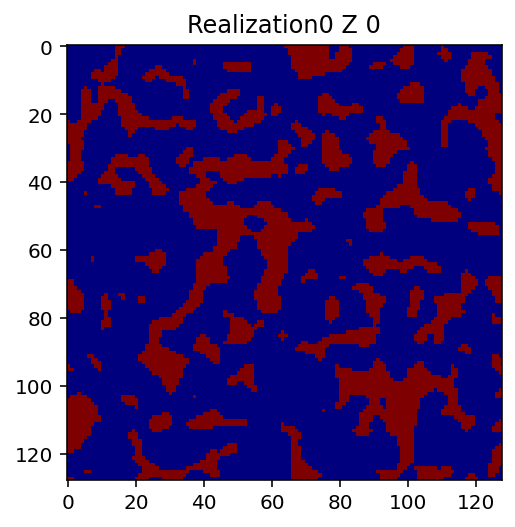

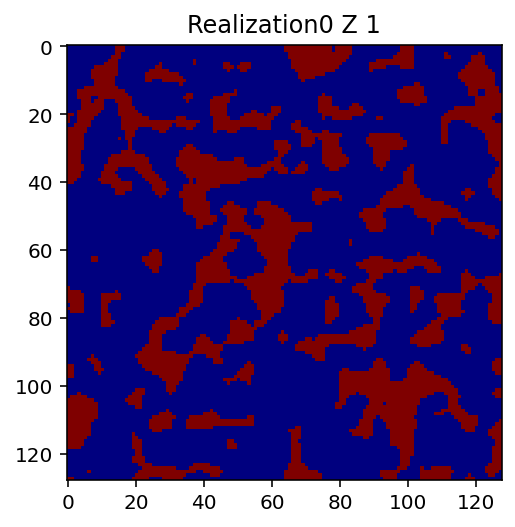

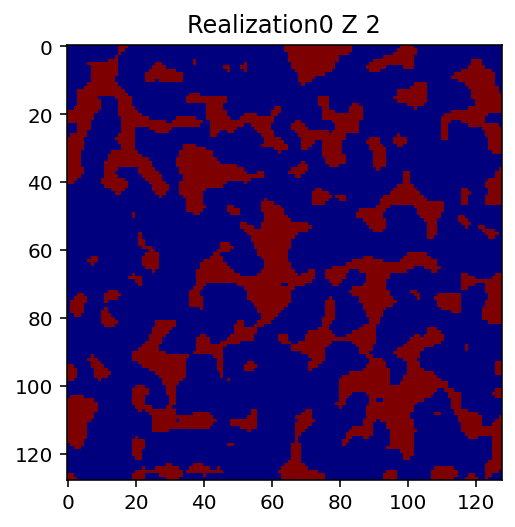

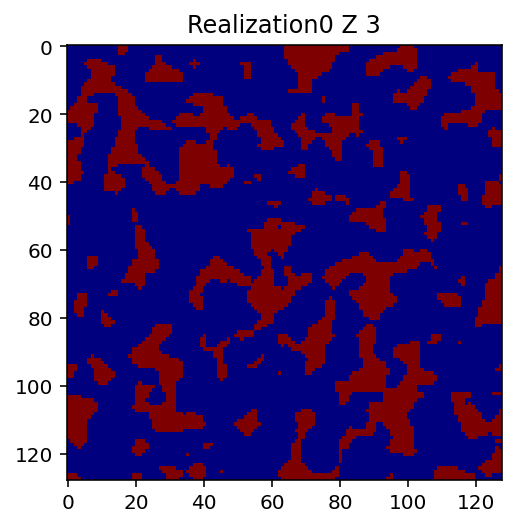

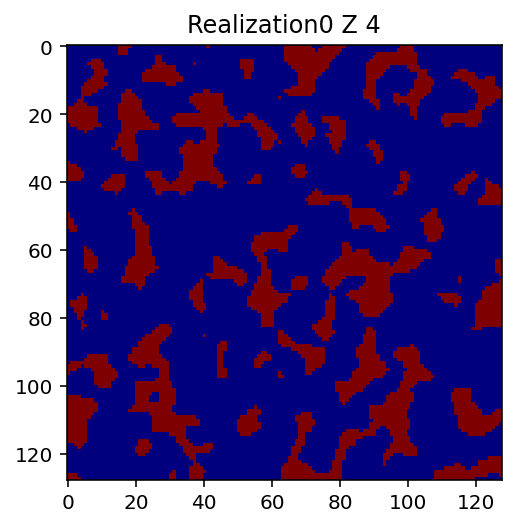

...

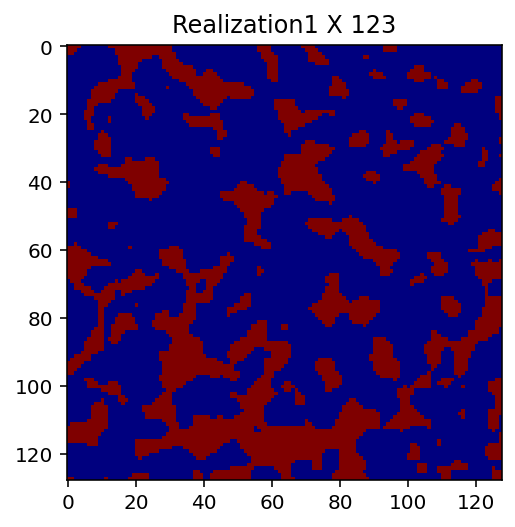

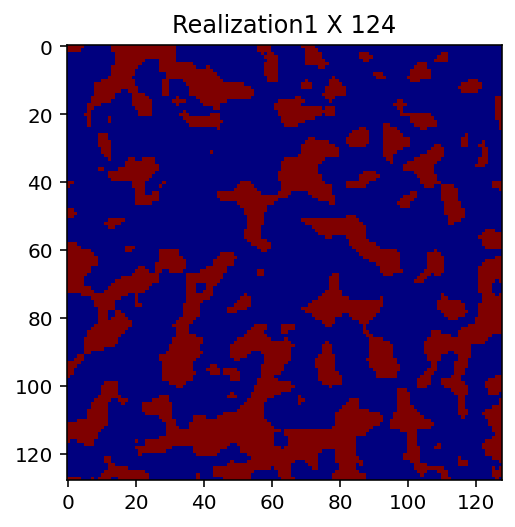

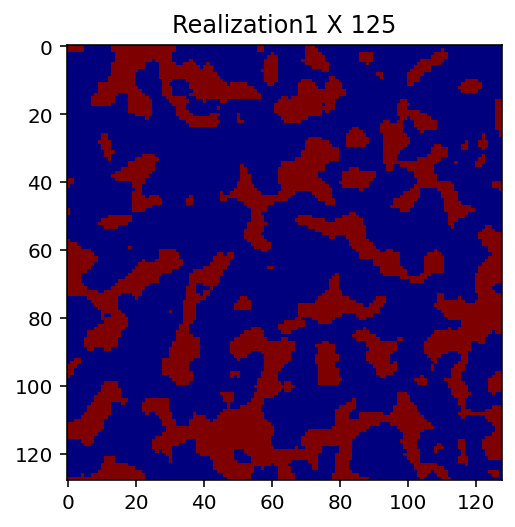

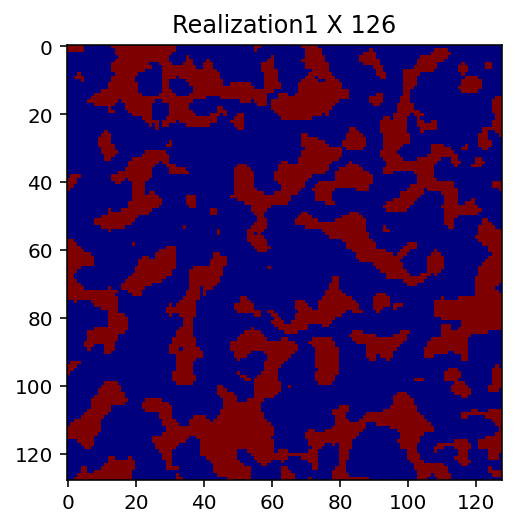

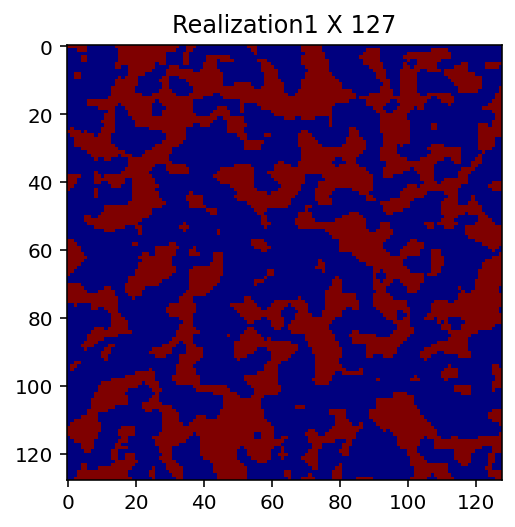

In [23]:
for index_realization in range(SimulationGrid_Num):
    
    for z in range(SimulationGrid_Layer):
        plt.imshow(Realizations_Student[index_realization, z], cmap='jet')
        plt.title(f'Realization{index_realization} Z {z}')
        plt.show()
        
    for y in range(SimulationGrid_Height):
        plt.imshow(Realizations_Student[index_realization,:,y,:], cmap='jet')
        plt.title(f'Realization{index_realization} Y {y}')
        plt.show()
        
    for x in range(SimualtionGrid_Width):
        plt.imshow(Realizations_Student[index_realization,:,:, x], cmap='jet')
        plt.title(f'Realization{index_realization} X {x}')
        plt.show()

In [25]:
np.savetxt(fname='Rock_Student_2.txt',X = np.array(Realizations_Student).reshape((1,-1)),fmt='%d',delimiter=',')